# Setup for getting Reproducible results

In [1]:
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
import matplotlib
%matplotlib inline

/anaconda3/envs/tensorflow/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)
Using TensorFlow backend.


In [2]:
os.environ['PYTHONHASHSEED'] = '0'

# setting the seed for numpy
np.random.seed(2108)

# setting the seed for python random numbers
random.seed(2108)

# setting the seed for tensorflow
tf.set_random_seed(2108)

from keras import backend as K

# Force tensorflow to use a single thread
session_conf = tf.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.Session(graph = tf.get_default_graph(), config=session_conf)
K.set_session(sess)

remaining code goes below

# Loading the Default Variables

In [3]:
print(os.listdir("input"))

['sample_submission.csv', 'test', 'test-flow', 'train', 'train_labels.csv', 'validation']


In [3]:
TRAIN_DIR = "input/train"
VALIDATION_DIR = "input/validation"
TEST_DIR = "input/test"
IMG_SIZE = 64
BATCH_SIZE = 256
DROP_PROB = 0.7

# Train a Basic Benchmark CNN

The CNN would have
<ul>
    <li> Two Convolutional Layers </li>
    <li> Two Maxpooling Layers </li>
    <li> flattening layer </li>
    <li> One Fully Connected Layer </li>
    <li> dropouts </li>
    <li> output layer with sigmoid activation </li>
</ul>

Importing required Libraries

In [4]:
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense, Dropout
from keras.callbacks import ModelCheckpoint, History, EarlyStopping
from keras.models import load_model

In [6]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255)

validation_datagen = ImageDataGenerator(rescale = 1./255)


training_set = train_datagen.flow_from_directory(TRAIN_DIR,
                                                 target_size = (IMG_SIZE, IMG_SIZE),
                                                 batch_size = BATCH_SIZE,
                                                 classes = ['non-invasive', 'invasive'],
                                                 class_mode = 'binary')

validation_set = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                 target_size = (IMG_SIZE, IMG_SIZE),
                                                 batch_size = BATCH_SIZE,
                                                 classes = ['non-invasive', 'invasive'],
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 1895 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


In [7]:
print(training_set.class_indices)
print(validation_set.class_indices)

{'invasive': 1, 'non-invasive': 0}
{'invasive': 1, 'non-invasive': 0}


In [8]:
classifier = Sequential()

classifier.add(Conv2D(64, (3, 3), input_shape = (IMG_SIZE, IMG_SIZE, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Conv2D(64, (3, 3), activation = 'relu'))
classifier.add(Dropout(DROP_PROB))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

classifier.add(Flatten())

classifier.add(Dense(units = 128, activation = 'relu'))
classifier.add(Dense(units = 1, activation = 'sigmoid'))

# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [9]:
filepath="model-benchmark.h5"
earlystop = EarlyStopping(monitor='val_loss', patience=15, verbose=1)
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto', save_weights_only=False, period=1)
callbacks_list = [checkpoint, earlystop]

In [10]:
print(classifier.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 62, 62, 64)        1792      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 31, 31, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 29, 29, 64)        36928     
_________________________________________________________________
dropout_1 (Dropout)          (None, 29, 29, 64)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 12544)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               1605760   
__________

In [11]:
history = classifier.fit_generator(training_set, nb_epoch = 100, validation_data = validation_set, callbacks=callbacks_list)

C:\Users\Sarthak Sahu\AppData\Local\conda\conda\envs\mlnd\lib\site-packages\ipykernel_launcher.py:1: UserWarning: The semantics of the Keras 2 argument `steps_per_epoch` is not the same as the Keras 1 argument `samples_per_epoch`. `steps_per_epoch` is the number of batches to draw from the generator at each epoch. Basically steps_per_epoch = samples_per_epoch/batch_size. Similarly `nb_val_samples`->`validation_steps` and `val_samples`->`steps` arguments have changed. Update your method calls accordingly.
  """Entry point for launching an IPython kernel.
C:\Users\Sarthak Sahu\AppData\Local\conda\conda\envs\mlnd\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<keras_pre..., validation_data=<keras_pre..., epochs=100, callbacks=[<keras.ca...)`
  """Entry point for launching an IPython kernel.


Epoch 1/100
8/8 [==============================] - 93s 12s/step - loss: 0.7817 - acc: 0.5789 - val_loss: 0.7243 - val_acc: 0.5000

Epoch 00001: val_loss improved from inf to 0.72433, saving model to model-benchmark.h5
Epoch 2/100
8/8 [==============================] - 70s 9s/step - loss: 0.5997 - acc: 0.6613 - val_loss: 0.6752 - val_acc: 0.5000

Epoch 00002: val_loss improved from 0.72433 to 0.67516, saving model to model-benchmark.h5
Epoch 3/100
8/8 [==============================] - 70s 9s/step - loss: 0.5597 - acc: 0.6854 - val_loss: 0.6883 - val_acc: 0.5075

Epoch 00003: val_loss did not improve from 0.67516
Epoch 4/100
8/8 [==============================] - 71s 9s/step - loss: 0.5102 - acc: 0.7361 - val_loss: 0.5857 - val_acc: 0.7250

Epoch 00004: val_loss improved from 0.67516 to 0.58571, saving model to model-benchmark.h5
Epoch 5/100
8/8 [==============================] - 73s 9s/step - loss: 0.4662 - acc: 0.7845 - val_loss: 0.5717 - val_acc: 0.7075

Epoch 00005: val_loss improve

Below are some visualizations

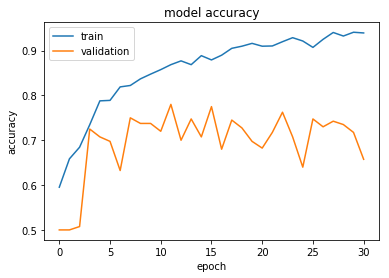

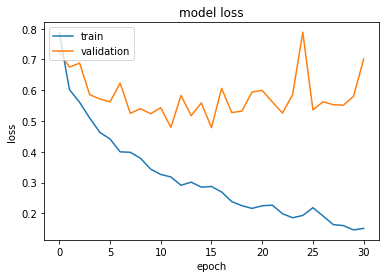

In [12]:
# taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
import matplotlib.pyplot as plt

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

Run the below cell to load the best model.

In [5]:

classifier = load_model("model-benchmark.h5")

Now, we will load the test images data to a numpy array for giving predictions using the trained model.

In [27]:
import cv2
import os
import pandas as pd
from tqdm import tqdm

df = pd.read_csv('input/train_labels.csv')
    
def create_test_data():
    testing_data = []
    for img in tqdm(os.listdir(TEST_DIR)):
        name = img.split('.')[0]
        path = os.path.join(TEST_DIR, img)
        img = cv2.imread(path)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        testing_data.append(np.array([name, np.array(img/255)], dtype=object))
    np.save('test_data-{}.npy'.format(IMG_SIZE), testing_data, allow_pickle=True)
    return testing_data

In [6]:
testing_data = None
if "test_data-{}.npy".format(IMG_SIZE) in os.listdir():
    testing_data = np.load("test_data-{}.npy".format(IMG_SIZE))
else:
    testing_data = create_test_data()

In [7]:
testing_x = np.array([i[1] for i in testing_data]).reshape(-1,IMG_SIZE,IMG_SIZE,3)
testing_name = np.array([i[0] for i in testing_data])

In [8]:
prediction_prob = list(classifier.predict(testing_x).transpose())[0]
prediction_classes = classifier.predict_classes(testing_x).transpose()[0]

# with open('prediction_basic_cnn.csv', 'w') as file:
#     file.write("name,invasive\n")
#     for i,j in zip(testing_name, prediction_prob):
#         file.write(str(i)+","+str(j))
#         file.write('\n')
sample_submission = pd.read_csv("input/sample_submission.csv")

for i, name in enumerate(testing_name):
    sample_submission.loc[sample_submission['name'] == int(name), 'invasive'] = prediction_prob[i]

sample_submission.to_csv("prediction_basic_cnn.csv", index=False)

(array([ 13.,  88., 165., 201., 187., 141., 127., 142., 164., 303.]),
 array([0.03356   , 0.13010664, 0.22665328, 0.32319993, 0.41974657,
        0.51629321, 0.61283985, 0.70938649, 0.80593313, 0.90247978,
        0.99902642]),
 <a list of 10 Patch objects>)

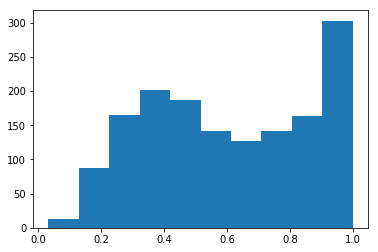

In [13]:
import matplotlib.pyplot as plt
plt.hist(prediction_prob, bins = 10)

The score obtained by submission of this model is : 0.86871

Let's see some visualizations of the kind of predictions the model is making...

In [31]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimage
def visual_predictions(size):
    samples = random.sample(list(zip(testing_name, prediction_classes)),size)
    plt.figure(figsize=(18,18))
    columns = 3
    for i, (name, pred_class) in enumerate(samples):
        path = os.path.join(TEST_DIR, name+'.jpg')
        image = mpimage.imread(path)
        plt.subplot(size / columns + 1, columns, i + 1)
        plt.title(name + " -- prediction -- " + str(pred_class))
        plt.imshow(image)   

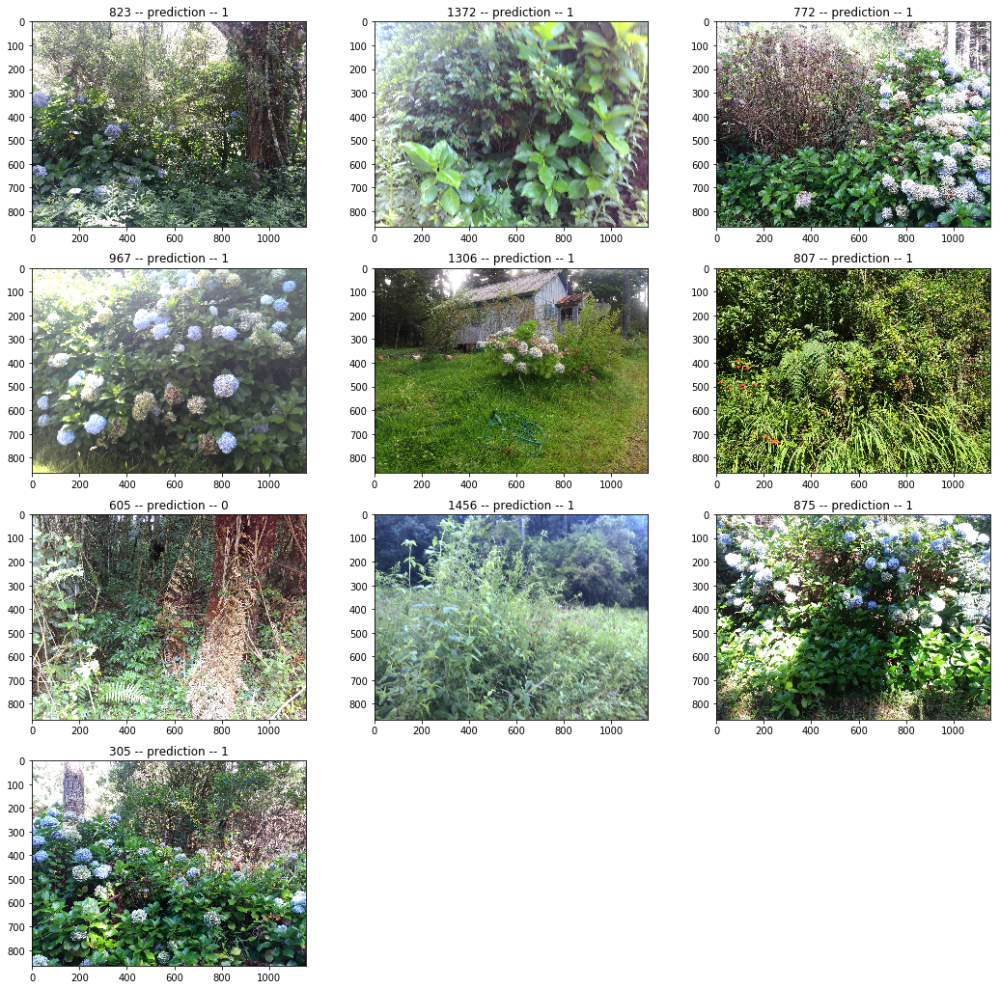

In [32]:
visual_predictions(10)

In [6]:
# from keras.utils import plot_model
# plot_model(classifier, to_file='basic-model.png')

In [33]:
# Get the filenames from the generator
fnames = validation_set.filenames
# print(fnames)

# Get the ground truth from generator
ground_truth = validation_set.classes
# print(ground_truth) 

# Get the label to class mapping from the generator
label2index = validation_set.class_indices
# print(label2index)

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())
print(idx2label)

{0: 'non-invasive', 1: 'invasive'}


In [34]:
# Get the predictions from the model using the generator
predictions = classifier.predict_generator(validation_set, verbose=1)

2/2 [==============================] - ETA:  - 13s 7s/step


In [35]:
prediction_classes = predictions > 0.5
prediction_classes = prediction_classes.astype(int).transpose()[0]

In [36]:
errors = np.where(prediction_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_set.samples))

No of errors = 90/400


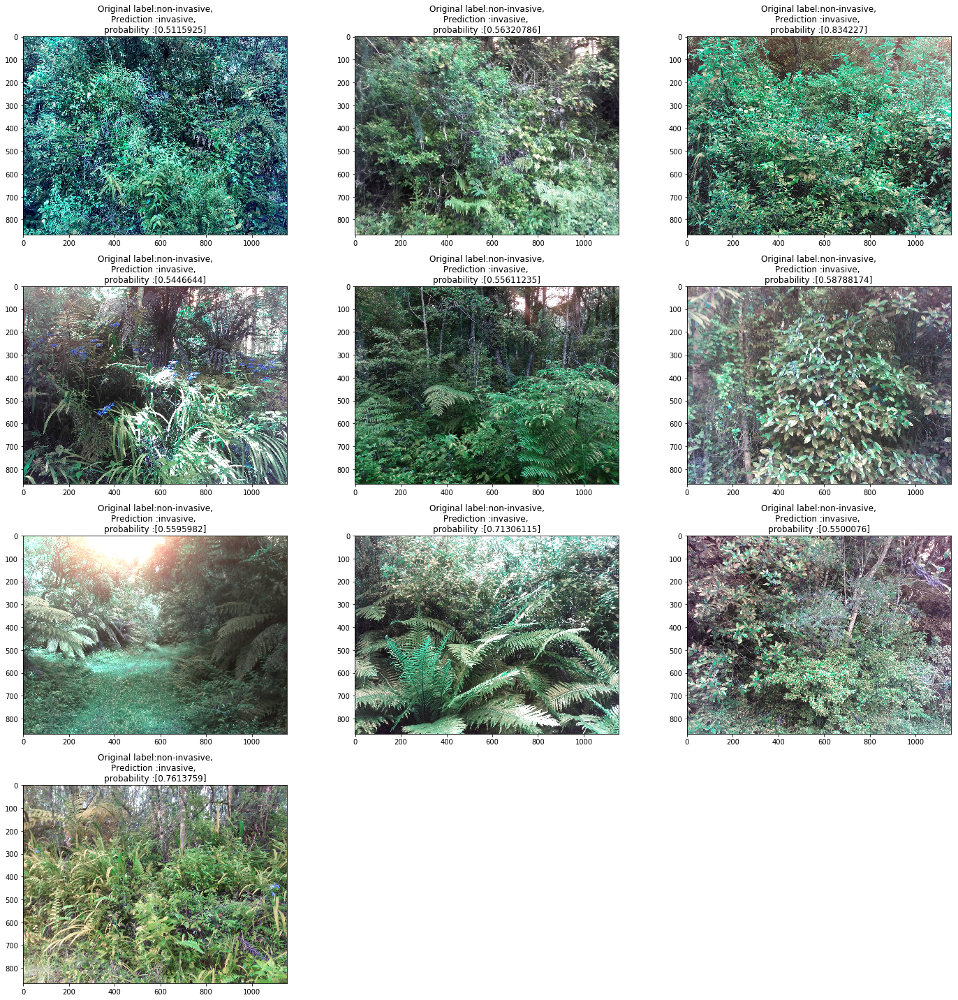

In [48]:
# Show the errors
plt.figure(figsize=(20,20))
columns = 3
samples = min(len(errors),10)
for i in range(len(errors))[:samples]:
    pred_class = prediction_classes[errors[i]]
    pred_label = idx2label[pred_class]
    
#     use split delimiter as '/'
    title = 'Original label:{},\nPrediction :{}, \nprobability :{}'.format(
        fnames[errors[i]].split('\\')[0],
        pred_label,
        predictions[errors[i]]
        )
    original = cv2.imread('{}/{}'.format(VALIDATION_DIR,fnames[errors[i]]))
    plt.subplot(samples/columns + 1, columns, i + 1)
    plt.title(title)
    plt.imshow(original)

plt.tight_layout()
plt.show()

# Optimizing the basic model

Now I will try to optimize the basic model by tweaking the architecture and hyperparameters.

In [20]:
# Here, I will use data augmentation technique
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,     
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

validation_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory(TRAIN_DIR,
                                                 target_size = (IMG_SIZE, IMG_SIZE),
                                                 batch_size = BATCH_SIZE,
                                                 classes = ['non-invasive', 'invasive'],
                                                 class_mode = 'binary')

validation_set = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                 target_size = (IMG_SIZE, IMG_SIZE),
                                                 batch_size = BATCH_SIZE,
                                                 classes = ['non-invasive', 'invasive'],
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 1895 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


In [21]:
classifier = Sequential()

classifier.add(Conv2D(64, (3, 3), input_shape = (IMG_SIZE, IMG_SIZE, 3), activation = 'relu', padding='same'))
classifier.add(MaxPooling2D(pool_size = (2, 2), padding='same'))
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding='same'))
classifier.add(Dropout(DROP_PROB))
classifier.add(MaxPooling2D(pool_size = (2, 2), padding='same'))

classifier.add(Flatten())

classifier.add(Dense(units = 256, activation = 'relu'))
classifier.add(Dropout(DROP_PROB))
classifier.add(Dense(units = 1, activation = 'sigmoid'))

# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [22]:
filepath="model-improved.hdf5"
earlystop = EarlyStopping(monitor='val_loss', patience=15, verbose=1)
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto', save_weights_only=False, period=1)
callbacks_list = [checkpoint, earlystop]

In [23]:
history = classifier.fit_generator(training_set, nb_epoch = 100, validation_data = validation_set, callbacks=callbacks_list)

C:\Users\Sarthak Sahu\AppData\Local\conda\conda\envs\mlnd\lib\site-packages\ipykernel_launcher.py:1: UserWarning: The semantics of the Keras 2 argument `steps_per_epoch` is not the same as the Keras 1 argument `samples_per_epoch`. `steps_per_epoch` is the number of batches to draw from the generator at each epoch. Basically steps_per_epoch = samples_per_epoch/batch_size. Similarly `nb_val_samples`->`validation_steps` and `val_samples`->`steps` arguments have changed. Update your method calls accordingly.
  """Entry point for launching an IPython kernel.
C:\Users\Sarthak Sahu\AppData\Local\conda\conda\envs\mlnd\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<keras_pre..., validation_data=<keras_pre..., epochs=100, callbacks=[<keras.ca...)`
  """Entry point for launching an IPython kernel.


Epoch 1/100
8/8 [==============================] - ETA: 1:24 - loss: 0.7448 - acc: 0.480 - ETA: 55s - loss: 2.4672 - acc: 0.539 - ETA: 45s - loss: 1.9622 - acc: 0.60 - ETA: 31s - loss: 1.6512 - acc: 0.58 - ETA: 23s - loss: 1.4736 - acc: 0.54 - ETA: 16s - loss: 1.3473 - acc: 0.52 - ETA: 8s - loss: 1.2542 - acc: 0.5227 - 83s 10s/step - loss: 1.1860 - acc: 0.5335 - val_loss: 0.6967 - val_acc: 0.5000

Epoch 00001: val_loss improved from inf to 0.69666, saving model to model-improved.hdf5
Epoch 2/100
8/8 [==============================] - ETA: 5s - loss: 0.6382 - acc: 0.687 - ETA: 13s - loss: 0.6500 - acc: 0.66 - ETA: 24s - loss: 0.6575 - acc: 0.65 - ETA: 23s - loss: 0.6449 - acc: 0.66 - ETA: 19s - loss: 0.6438 - acc: 0.66 - ETA: 13s - loss: 0.6375 - acc: 0.66 - ETA: 7s - loss: 0.6362 - acc: 0.6646 - 69s 9s/step - loss: 0.6411 - acc: 0.6516 - val_loss: 0.6884 - val_acc: 0.5000

Epoch 00002: val_loss improved from 0.69666 to 0.68836, saving model to model-improved.hdf5
Epoch 3/100
8/8 [=====


Epoch 00035: val_loss improved from 0.40458 to 0.38443, saving model to model-improved.hdf5
Epoch 36/100
8/8 [==============================] - ETA: 5s - loss: 0.3242 - acc: 0.878 - ETA: 3s - loss: 0.3182 - acc: 0.866 - ETA: 16s - loss: 0.3052 - acc: 0.86 - ETA: 19s - loss: 0.2917 - acc: 0.87 - ETA: 16s - loss: 0.2944 - acc: 0.87 - ETA: 12s - loss: 0.2991 - acc: 0.87 - ETA: 6s - loss: 0.3052 - acc: 0.8726 - 71s 9s/step - loss: 0.3121 - acc: 0.8681 - val_loss: 0.4043 - val_acc: 0.8100

Epoch 00036: val_loss did not improve from 0.38443
Epoch 37/100
8/8 [==============================] - ETA: 5s - loss: 0.2726 - acc: 0.878 - ETA: 3s - loss: 0.2699 - acc: 0.856 - ETA: 16s - loss: 0.2952 - acc: 0.84 - ETA: 19s - loss: 0.2877 - acc: 0.85 - ETA: 16s - loss: 0.2842 - acc: 0.86 - ETA: 12s - loss: 0.2854 - acc: 0.86 - ETA: 6s - loss: 0.2932 - acc: 0.8654 - 71s 9s/step - loss: 0.2902 - acc: 0.8678 - val_loss: 0.4079 - val_acc: 0.8050

Epoch 00037: val_loss did not improve from 0.38443
Epoch 38/

8/8 [==============================] - ETA: 5s - loss: 0.2318 - acc: 0.914 - ETA: 16s - loss: 0.2057 - acc: 0.91 - ETA: 25s - loss: 0.2151 - acc: 0.91 - ETA: 24s - loss: 0.2158 - acc: 0.91 - ETA: 19s - loss: 0.2148 - acc: 0.91 - ETA: 13s - loss: 0.2148 - acc: 0.91 - ETA: 6s - loss: 0.2164 - acc: 0.9178 - 70s 9s/step - loss: 0.2118 - acc: 0.9188 - val_loss: 0.3762 - val_acc: 0.8325

Epoch 00071: val_loss did not improve from 0.31667
Epoch 72/100
8/8 [==============================] - ETA: 5s - loss: 0.1962 - acc: 0.941 - ETA: 17s - loss: 0.1896 - acc: 0.93 - ETA: 26s - loss: 0.2198 - acc: 0.92 - ETA: 24s - loss: 0.2155 - acc: 0.92 - ETA: 19s - loss: 0.2087 - acc: 0.92 - ETA: 13s - loss: 0.2092 - acc: 0.92 - ETA: 6s - loss: 0.1981 - acc: 0.9283 - 71s 9s/step - loss: 0.1959 - acc: 0.9286 - val_loss: 0.3311 - val_acc: 0.8625

Epoch 00072: val_loss did not improve from 0.31667
Epoch 73/100
8/8 [==============================] - ETA: 5s - loss: 0.1796 - acc: 0.945 - ETA: 3s - loss: 0.1729 - 

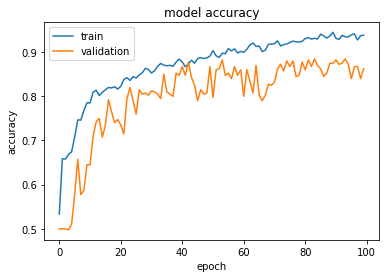

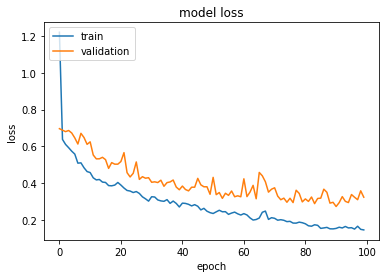

In [24]:
# taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/
import matplotlib.pyplot as plt

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [14]:

classifier = load_model("model-improved.hdf5")

In [15]:
prediction_prob = list(classifier.predict(testing_x).transpose())[0]
prediction_classes = classifier.predict_classes(testing_x)

# with open('prediction_basic_cnn_improved.csv', 'w') as file:
#     file.write("name,invasive\n")
#     for i,j in zip(testing_name, prediction_prob):
#         file.write(str(i)+","+str(j))
#         file.write('\n')
sample_submission = pd.read_csv("input/sample_submission.csv")

for i, name in enumerate(testing_name):
    sample_submission.loc[sample_submission['name'] == int(name), 'invasive'] = prediction_prob[i]

sample_submission.to_csv("prediction_basic_cnn_improved.csv", index=False)

(array([608., 164.,  93.,  77.,  72.,  51.,  53.,  67.,  83., 263.]),
 array([1.59000265e-04, 1.00143076e-01, 2.00127153e-01, 3.00111229e-01,
        4.00095305e-01, 5.00079381e-01, 6.00063457e-01, 7.00047533e-01,
        8.00031609e-01, 9.00015685e-01, 9.99999762e-01]),
 <a list of 10 Patch objects>)

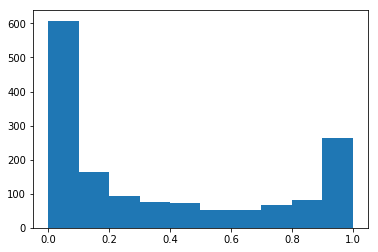

In [16]:
import matplotlib.pyplot as plt
plt.hist(prediction_prob, bins = 10)

The score obtained by submission of this model is : 0.86126

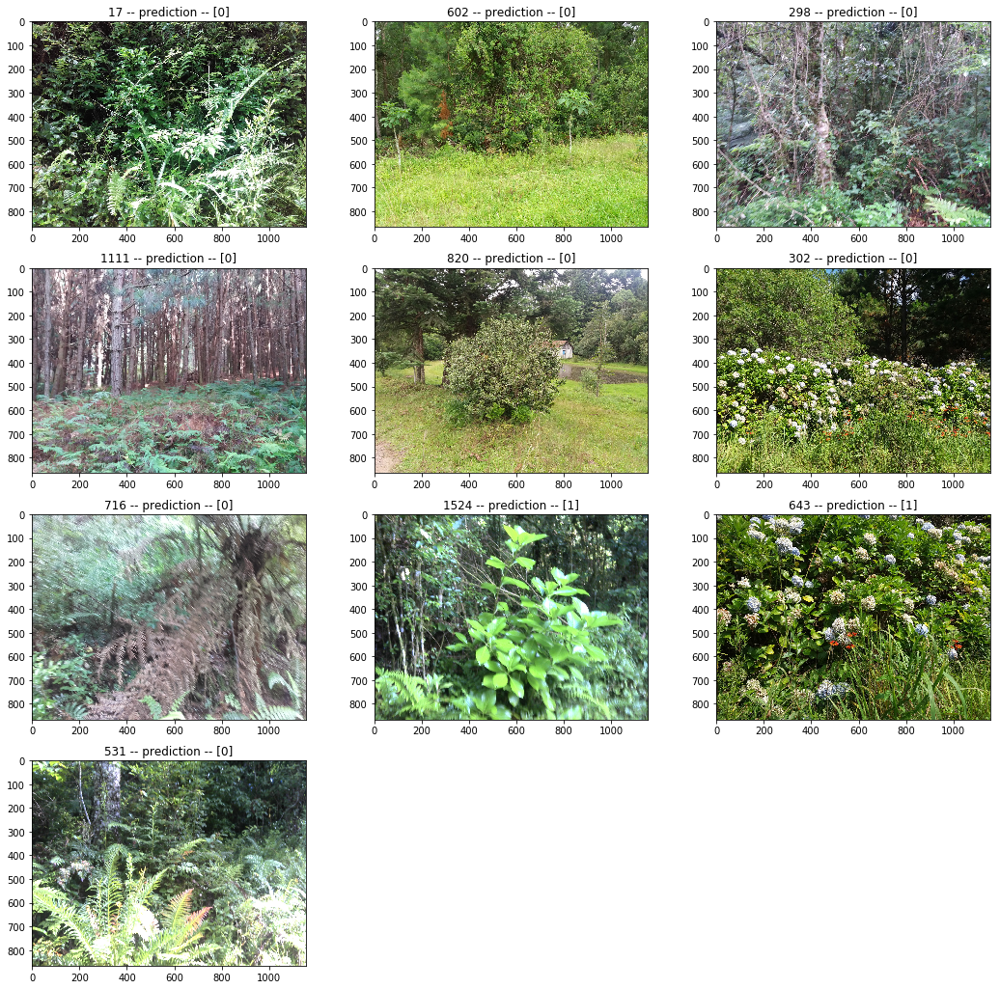

In [51]:
visual_predictions(10)

In [8]:
# from keras.utils import plot_model
# plot_model(classifier, to_file='improved-model.png')

In [52]:
# Get the filenames from the generator
fnames = validation_set.filenames
# print(fnames)

# Get the ground truth from generator
ground_truth = validation_set.classes
# print(ground_truth) 

# Get the label to class mapping from the generator
label2index = validation_set.class_indices
# print(label2index)

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())
print(idx2label)

{0: 'non-invasive', 1: 'invasive'}


In [53]:
# Get the predictions from the model using the generator
predictions = classifier.predict_generator(validation_set, verbose=1)

2/2 [==============================] - ETA:  - 14s 7s/step


In [54]:
prediction_classes = predictions > 0.5
prediction_classes = prediction_classes.astype(int).transpose()[0]

In [55]:
errors = np.where(prediction_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_set.samples))

No of errors = 47/400


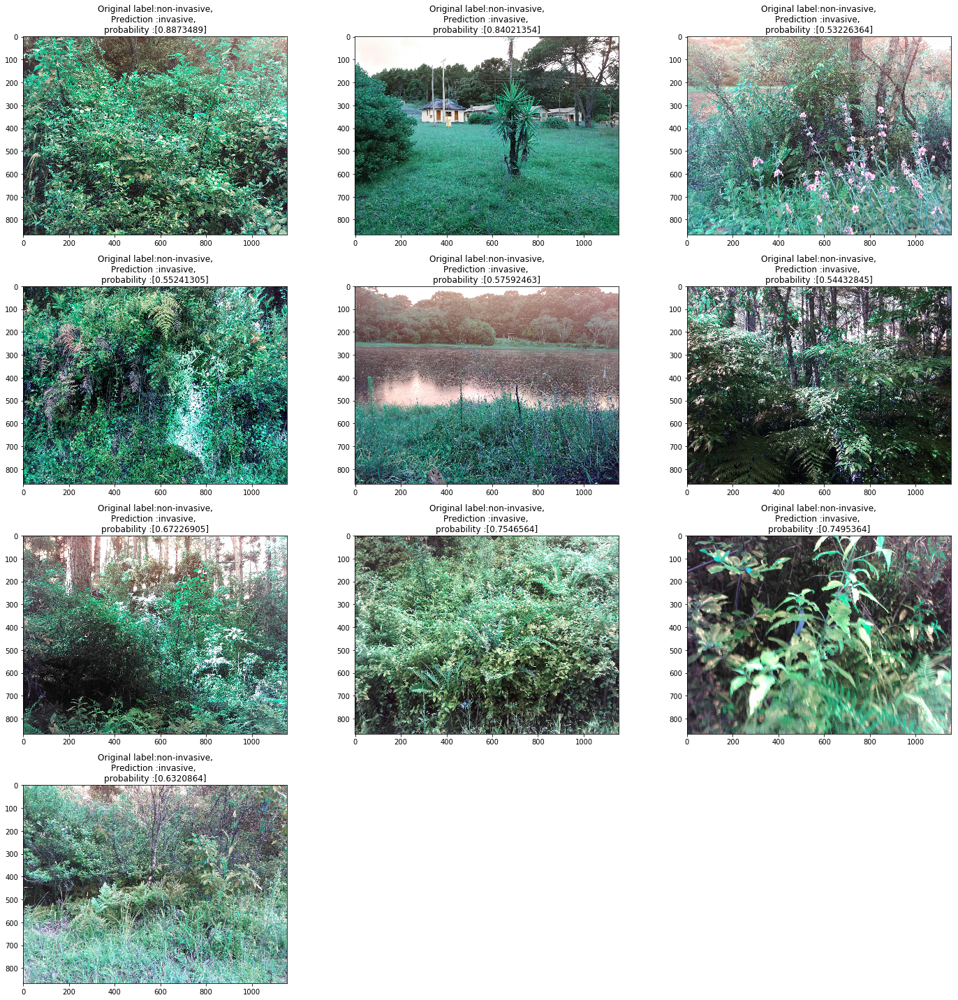

In [56]:
# Show the errors
plt.figure(figsize=(20,20))
columns = 3
samples = 10
for i in range(len(errors))[:samples]:
    pred_class = prediction_classes[errors[i]]
    pred_label = idx2label[pred_class]
    
#     use split delimiter as '/'
    title = 'Original label:{},\nPrediction :{}, \nprobability :{}'.format(
        fnames[errors[i]].split('\\')[0],
        pred_label,
        predictions[errors[i]]
        )
    original = cv2.imread('{}/{}'.format(VALIDATION_DIR,fnames[errors[i]]))
    plt.subplot(samples/columns + 1, columns, i + 1)
    plt.title(title)
    plt.imshow(original)

plt.tight_layout()
plt.show()

In a different notebook, I will now try to improve the scores obtained by the basic cnn using weights of a pretrained model. Let's see if that gets us better results.